In [98]:
import random

import folium
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import shapely.geometry as sg

from google.cloud import bigquery

In [2]:
PROJECTION = "EPSG:2284"

In [3]:
bq = bigquery.Client()

## Heuristic #1: Corner lots have a frontage:exterior ratio

In [245]:
parcels = bq.query(
    """
        select
            details.geoparceli as gpin,
            details.parcelnumb as parcel_number,
            concat(coalesce(details.streetnumb, "?"), " ", details.streetname) as address,
            details.ownername as owner_name,
            details.zoning,
            frontage.length as frontage_length,
            frontage.geometry as frontage_geometry,
            zoning.flum_desig as flum_designation,
            zoning.draft_zoni as draft_zoning,
            residential.usecode as use_code,
            st_geogfromgeojson(details.geometry) as geometry,
        from `cvilledata.cville_open_data.parcel_area_details` details
        left join `whatthecarp.cville_eda_raw.draft_zoning_202302` zoning on details.parcelnumb = zoning.parcelnumb
        left join `cvilledata.cville_open_data.real_estate_residential_details` residential on details.parcelnumb = residential.parcelnumb
        join `cvilledata.cville_open_data_derived.road_frontage` frontage on details.geoparceli = frontage.gpin
    """
).result().to_geodataframe(geography_column="geometry")

parcels.frontage_geometry = gpd.GeoSeries(parcels.frontage_geometry).set_crs(parcels.crs).to_crs(PROJECTION)
parcels.geometry = parcels.geometry.to_crs(PROJECTION)

<Axes: >

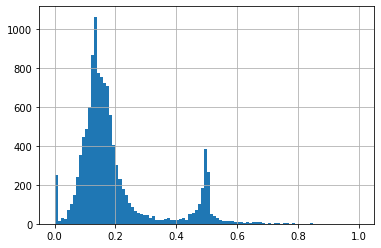

In [246]:
frontage_ratio = parcels.frontage_length / parcels.geometry.convex_hull.exterior.length
frontage_ratio[
    (parcels.draft_zoning.isin(["R-A", "R-B", "R-C"]))
    & (frontage_ratio <= 1)
].hist(bins=100)

In [247]:
# Map parcels and imputed street frontage for quality control
parcels = parcels[["geometry", "gpin", "parcel_number", "address", "frontage_length"]]
parcels["frontage_ratio"] = parcels.frontage_length / parcels.geometry.convex_hull.exterior.length
parcels["is_corner_lot"] = parcels.frontage_ratio >= 0.33

def parcel_style(shape):
    if shape["properties"]["is_corner_lot"]:
        color = "green"
    else:
        color = "red"
    return {
        "fillColor": color,
        "weight": 0.1,
    }

map_ = folium.Map(
    location=[38.04, -78.49],
    tiles="cartodbpositron",
    zoom_start=13.5,
    zoom_delta=0.5,
)
folium.GeoJson(
    parcels,
    style_function=parcel_style,
    tooltip=folium.GeoJsonTooltip(fields=["gpin", "parcel_number", "address", "frontage_ratio"]),
).add_to(map_)
map_

In [248]:
parcels.to_csv("corner-lots-frontage.csv", index=False)

## Heuristic #2 (WIP): Corner lots intersect multiple roads

In [188]:
parcels = bq.query(
    """
        select
            details.geoparceli as gpin,
            details.parcelnumb as parcel_number,
            concat(coalesce(details.streetnumb, "?"), " ", details.streetname) as address,
            details.ownername as owner_name,
            details.zoning,
            frontage.length as frontage_length,
            frontage.geometry as frontage_geometry,
            zoning.flum_desig as flum_designation,
            zoning.draft_zoni as draft_zoning,
            residential.usecode as use_code,
            st_geogfromgeojson(details.geometry) as geometry,
        from `cvilledata.cville_open_data.parcel_area_details` details
        left join `whatthecarp.cville_eda_raw.draft_zoning_202302` zoning on details.parcelnumb = zoning.parcelnumb
        left join `cvilledata.cville_open_data.real_estate_residential_details` residential on details.parcelnumb = residential.parcelnumb
        join `cvilledata.cville_open_data_derived.road_frontage` frontage on details.geoparceli = frontage.gpin
    """
).result().to_geodataframe(geography_column="geometry")

parcels.frontage_geometry = gpd.GeoSeries(parcels.frontage_geometry).set_crs(parcels.crs).to_crs(PROJECTION)
parcels.geometry = parcels.geometry.to_crs(PROJECTION)

In [6]:
road_area = bq.query(
    """
    select
        st_union_agg(st_geogfromgeojson(geometry)) as geometry,
    from `cvilledata.cville_open_data.road_area`
    """
).result().to_geodataframe().to_crs(PROJECTION)

In [207]:
road_lines = bq.query(
    """
    select
        streetname,
        st_union_agg(st_geogfromgeojson(geometry)) as geometry,
    from `cvilledata.cville_open_data.road_centerlines`
    group by streetname
    """
).result().to_geodataframe().to_crs(PROJECTION)

In [7]:
# Buffer roads to account for right of way between roads and parcels, then subtract
# parcels to prevent overlap.
parcels_mask = parcels.geometry.unary_union
road_area_masked = road_area.geometry.unary_union.buffer(30).difference(parcels_mask)

In [8]:
# Contract and dilate roads to remove fractions of alleys, then intersect with original
# roads to prevent overlap with parcels. Note that this only removes narrow alleys; if we
# buffer too much, we'll remove real roads.
road_area_masked_smoothed = road_area_masked.buffer(-7.5).buffer(10).intersection(road_area_masked)

In [208]:
road_lines["buffered"] = road_lines.geometry.buffer(30, cap_style=shapely.BufferCapStyle.flat).intersection(road_area_masked_smoothed)

In [236]:
def plot_random_road(road_lines, ax=None):
    index = random.choice(range(len(road_lines)))
    gpd.GeoSeries([
        road_lines.buffered[index], road_lines.geometry[index].buffer(8)
    ]).plot(color=["blue", "red"], alpha=0.5, ax=ax)
    if ax:
        ax.set_title(road_lines.streetname[index])

/Users/jmcarp/.pyenv/versions/3.9.12/envs/cat/lib/python3.9/site-packages/geopandas/plotting.py:51: ShapelyDeprecationWarning: The 'type' attribute is deprecated, and will be removed in the future. You can use the 'geom_type' attribute instead.
  if geom is not None and geom.type.startswith(prefix) and not geom.is_empty:


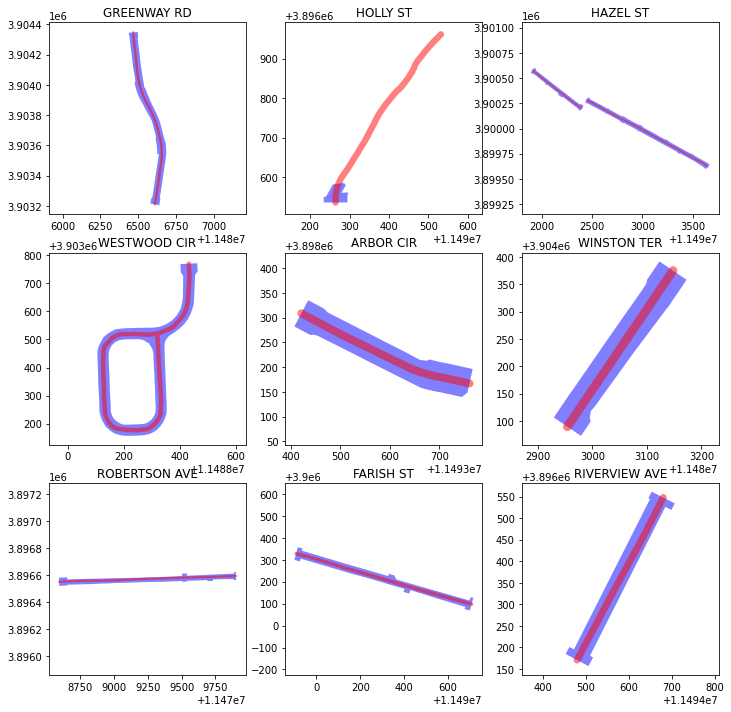

In [237]:
plt.figure(figsize=[12, 12])

for index in range(9):
    ax = plt.subplot(3, 3, index + 1)
    ax.set_aspect("equal", adjustable="datalim")
    plot_random_road(road_lines, ax=ax)

plt.show()

In [238]:
parcels["frontage_buffered"] = parcels.frontage_geometry.buffer(10)
parcels_to_roads = gpd.sjoin(
    parcels.set_geometry("frontage_buffered"),
    road_lines.set_geometry("buffered"),
)

In [240]:
parcel_road_counts = parcels_to_roads.groupby(["parcel_number"]).count().reset_index()[["parcel_number", "gpin"]].rename(columns={"gpin": "road_count"})

In [111]:
parcels.set_geometry("frontage_geometry").buffer(10)

0        POLYGON ((-88.500 38.152, -88.502 38.202, -88....
1        POLYGON ((-85.403 45.276, -85.410 45.283, -85....
2        POLYGON ((-86.027 31.470, -86.636 32.240, -87....
3        POLYGON ((-70.758 44.379, -70.175 43.590, -69....
4        POLYGON ((-86.146 31.604, -86.741 32.385, -87....
                               ...                        
16044    POLYGON ((-82.671 28.941, -83.540 29.396, -84....
16045                                                 None
16046    POLYGON ((-88.466 38.063, -88.470 38.338, -88....
16047    POLYGON ((-82.637 28.920, -83.509 29.372, -84....
16048    POLYGON ((-74.254 47.078, -73.386 46.620, -72....
Length: 16049, dtype: geometry

In [242]:
parcel_road_counts[parcel_road_counts.parcel_number == "240105000"]

,parcel_number,road_count
4739,240105000,2


In [141]:
type(parcels.frontage_geometry[1])

shapely.geometry.linestring.LineString

In [162]:
# Map parcels and imputed street frontage for quality control
map_df = parcels[["frontage_buffered", "gpin", "parcel_number", "address"]]
# map_df["frontage_length"] = frontage_coalesced.length

def parcel_style(shape):
#     if shape["properties"]["frontage_length"] > 0:
#         color = "green"
#     else:
#         color = "red"
    return {
        "fillColor": "pink",
        "weight": 0.1,
    }

map_ = folium.Map(
    location=[38.04, -78.49],
    tiles="cartodbpositron",
    zoom_start=13.5,
    zoom_delta=0.5,
)
folium.GeoJson(
    map_df[~gpd.GeoSeries(map_df.frontage_buffered).is_empty].set_geometry("frontage_buffered"),
    style_function=parcel_style,
    tooltip=folium.GeoJsonTooltip(fields=["gpin", "parcel_number", "address", "frontage_length"]),
).add_to(map_)
# folium.GeoJson(
#     frontage_coalesced.buffer(10),
#     style_function=lambda shape: {"fillColor": "purple", "weight": 0.1},
# ).add_to(map_)
map_

TypeError: 'NoneType' object is not subscriptable